In [40]:
# data cleaning and plots
#data collection.
#data preprocessing and cleaning.
#feature selection.
#data Analysis.
#model implementation.
#training and testing.
#evaluation.
import pandas as pd #data read
import numpy as np#math function
import seaborn as sns#graph
import matplotlib.pyplot as plt#graph
plt.style.use('ggplot')
%matplotlib inline

# sklearn: data preprocessing
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder

# sklearn: train model
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, cross_validate, StratifiedKFold
from sklearn.metrics import precision_recall_curve, precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score, confusion_matrix, classification_report

# sklearn classifiers

from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

from sklearn import datasets, ensemble, model_selection
from sklearn.ensemble import RandomForestClassifier

from sklearn.neural_network import MLPClassifier

In [41]:
# Load data
initial_data = pd.read_csv(r'C:\Users\MrLaptop\Desktop\unsw.csv')

In [42]:
# Look at the first 5 rows
initial_data.head(n=5)

,dur,spkts,dpkts,sbytes,dbytes,rate,sttl,dttl,sload,dload,...,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,0.000011,2,0,496,0,90909.0902,254,0,180363632.0,0.0,...,1,2,0,0,0,1,2,0,Normal,0
1,0.000008,2,0,1762,0,125000.0003,254,0,881000000.0,0.0,...,1,2,0,0,0,1,2,0,Normal,0
2,0.000005,2,0,1068,0,200000.0051,254,0,854400000.0,0.0,...,1,3,0,0,0,1,3,0,Normal,0
3,0.000006,2,0,900,0,166666.6608,254,0,600000000.0,0.0,...,1,3,0,0,0,2,3,0,Normal,0
4,0.000010,2,0,2126,0,100000.0025,254,0,850400000.0,0.0,...,1,3,0,0,0,2,3,0,Normal,0


In [43]:

initial_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82332 entries, 0 to 82331
Data columns (total 41 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   dur                82332 non-null  float64
 1   spkts              82332 non-null  int64  
 2   dpkts              82332 non-null  int64  
 3   sbytes             82332 non-null  int64  
 4   dbytes             82332 non-null  int64  
 5   rate               82332 non-null  float64
 6   sttl               82332 non-null  int64  
 7   dttl               82332 non-null  int64  
 8   sload              82332 non-null  float64
 9   dload              82332 non-null  float64
 10  sloss              82332 non-null  int64  
 11  dloss              82332 non-null  int64  
 12  sinpkt             82332 non-null  float64
 13  dinpkt             82332 non-null  float64
 14  sjit               82332 non-null  float64
 15  djit               82332 non-null  float64
 16  swin               823

In [44]:

initial_data.isnull().sum()#check null value

dur                  0
spkts                0
dpkts                0
sbytes               0
dbytes               0
rate                 0
sttl                 0
dttl                 0
sload                0
dload                0
sloss                0
dloss                0
sinpkt               0
dinpkt               0
sjit                 0
djit                 0
swin                 0
stcpb                0
dtcpb                0
dwin                 0
tcprtt               0
synack               0
ackdat               0
smean                0
dmean                0
trans_depth          0
response_body_len    0
ct_srv_src           0
ct_state_ttl         0
ct_dst_ltm           0
ct_src_dport_ltm     0
ct_dst_sport_ltm     0
ct_dst_src_ltm       0
is_ftp_login         0
ct_ftp_cmd           0
ct_flw_http_mthd     0
ct_src_ltm           0
ct_srv_dst           0
is_sm_ips_ports      0
attack_cat           0
label                0
dtype: int64

In [45]:
# Discard the rows with missing values
data_to_use = initial_data.dropna()


data_to_use.shape

(82332, 41)

In [46]:
X = data_to_use.drop(axis=1, columns=['attack_cat']) # X is a dataframe
X = X.drop(axis=1, columns=['label'])


y1 = data_to_use['attack_cat'].values # y is an array
y2 = data_to_use['label'].values

In [47]:
# Calculate Y2 ratio
def data_ratio(y2):
    '''
    Calculate Y2's ratio
    '''
    unique, count = np.unique(y2, return_counts=True)
    ratio = round(count[0]/count[1], 1)
    return f'{ratio}:1 ({count[0]}/{count[1]})'

In [48]:
print('The class ratio for the original data:', data_ratio(y1))
plt.figure(figsize=(13,5))
sns.countplot(y1,label="Sum")
plt.show()

print('The class ratio for the original data:', data_ratio(y2))
sns.countplot(y2,label="Sum")
plt.show()

The class ratio for the original data: 1.2:1 (677/583)


ValueError: could not convert string to float: 'Normal'

<Figure size 1300x500 with 0 Axes>

Text(0.5, 1.0, 'The Distribution of Category')

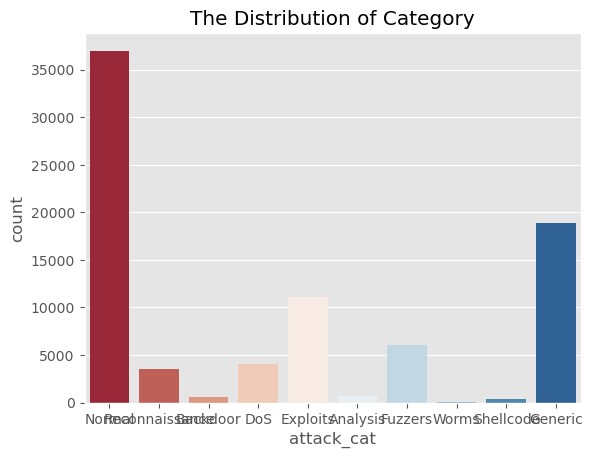

In [106]:
import seaborn as sns
sns.countplot(data = data_to_use, x = "attack_cat", palette = "RdBu")
plt.title("The Distribution of Category")

In [49]:
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

In [50]:
#print('The class ratio in training data: ', data_ratio(y_train))
#print('The class ratio in testing data: ', data_ratio(y_test))

In [51]:
# Load data
test_data = pd.read_csv(r'C:\Users\MrLaptop\Desktop\tstt.csv')
X_test = test_data.drop(axis=1, columns=['attack_cat']) # X_test is a dataframe
X_test = X_test.drop(axis=1, columns=['label'])


y1_test = test_data['attack_cat'].values # y is an array
y2_test = test_data['label'].values

In [52]:
X_train = X
y1_train = y1
y2_train = y2

In [53]:
# determine categorical and numerical columns
numerical_cols = X_train.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = X_train.select_dtypes(include=['object', 'bool']).columns

In [54]:
numerical_cols

Index(['dur', 'spkts', 'dpkts', 'sbytes', 'dbytes', 'rate', 'sttl', 'dttl',
       'sload', 'dload', 'sloss', 'dloss', 'sinpkt', 'dinpkt', 'sjit', 'djit',
       'swin', 'stcpb', 'dtcpb', 'dwin', 'tcprtt', 'synack', 'ackdat', 'smean',
       'dmean', 'trans_depth', 'response_body_len', 'ct_srv_src',
       'ct_state_ttl', 'ct_dst_ltm', 'ct_src_dport_ltm', 'ct_dst_sport_ltm',
       'ct_dst_src_ltm', 'is_ftp_login', 'ct_ftp_cmd', 'ct_flw_http_mthd',
       'ct_src_ltm', 'ct_srv_dst', 'is_sm_ips_ports'],
      dtype='object')

In [55]:
# define the transformation methods for the columns
t = [('ohe', OneHotEncoder(drop='first'), categorical_cols),
    ('scale', StandardScaler(), numerical_cols)]

col_trans = ColumnTransformer(transformers=t)

# fit the transformation on training data
col_trans.fit(X_train)

ColumnTransformer(transformers=[('ohe', OneHotEncoder(drop='first'),
                                 Index([], dtype='object')),
                                ('scale', StandardScaler(),
                                 Index(['dur', 'spkts', 'dpkts', 'sbytes', 'dbytes', 'rate', 'sttl', 'dttl',
       'sload', 'dload', 'sloss', 'dloss', 'sinpkt', 'dinpkt', 'sjit', 'djit',
       'swin', 'stcpb', 'dtcpb', 'dwin', 'tcprtt', 'synack', 'ackdat', 'smean',
       'dmean', 'trans_depth', 'response_body_len', 'ct_srv_src',
       'ct_state_ttl', 'ct_dst_ltm', 'ct_src_dport_ltm', 'ct_dst_sport_ltm',
       'ct_dst_src_ltm', 'is_ftp_login', 'ct_ftp_cmd', 'ct_flw_http_mthd',
       'ct_src_ltm', 'ct_srv_dst', 'is_sm_ips_ports'],
      dtype='object'))])

In [56]:
X_train_transform = col_trans.transform(X_train)

In [57]:
# apply transformation to both training and testing data 
# fit the transformation on training data

In [58]:
X_test_transform = col_trans.transform(X_test)

In [59]:
# look at the transformed training data
X_train_transform.shape

(82332, 39)

In [60]:
X_test_transform.shape

(175341, 39)

In [61]:
# Note that the distinct values/labels in `y2` target are 1 and 2. 
pd.unique(y1)

array(['Normal', 'Reconnaissance', 'Backdoor', 'DoS', 'Exploits',
       'Analysis', 'Fuzzers', 'Worms', 'Shellcode', 'Generic'],
      dtype=object)

In [62]:
pd.unique(y2)

array([0, 1], dtype=int64)

In [63]:
# Define a LabelEncoder() transformation method and fit on y1_train
target_trans = LabelEncoder()
target_trans.fit(y1_train)

LabelEncoder()

In [64]:
# apply transformation method on y1_train and y1_test
y1_train_transform = target_trans.transform(y1_train)
y1_test_transform = target_trans.transform(y1_test)

In [65]:
# view the transformed y1_train
y1_train_transform

array([6, 6, 6, ..., 6, 6, 6])

In [66]:
# Define a LabelEncoder() transformation method and fit on y2_train
target_trans = LabelEncoder()
target_trans.fit(y2_train)
y2_train_transform = target_trans.transform(y2_train)
y2_test_transform = target_trans.transform(y2_test)

In [67]:
# view the transformed y2_train
y2_train_transform

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [68]:
# model and fit
DTclf = tree.DecisionTreeClassifier()
DTclf.fit(X_train_transform, y2_train_transform)

DecisionTreeClassifier()

In [69]:
feature_names = np.array(numerical_cols)
feature_names

array(['dur', 'spkts', 'dpkts', 'sbytes', 'dbytes', 'rate', 'sttl',
       'dttl', 'sload', 'dload', 'sloss', 'dloss', 'sinpkt', 'dinpkt',
       'sjit', 'djit', 'swin', 'stcpb', 'dtcpb', 'dwin', 'tcprtt',
       'synack', 'ackdat', 'smean', 'dmean', 'trans_depth',
       'response_body_len', 'ct_srv_src', 'ct_state_ttl', 'ct_dst_ltm',
       'ct_src_dport_ltm', 'ct_dst_sport_ltm', 'ct_dst_src_ltm',
       'is_ftp_login', 'ct_ftp_cmd', 'ct_flw_http_mthd', 'ct_src_ltm',
       'ct_srv_dst', 'is_sm_ips_ports'], dtype=object)

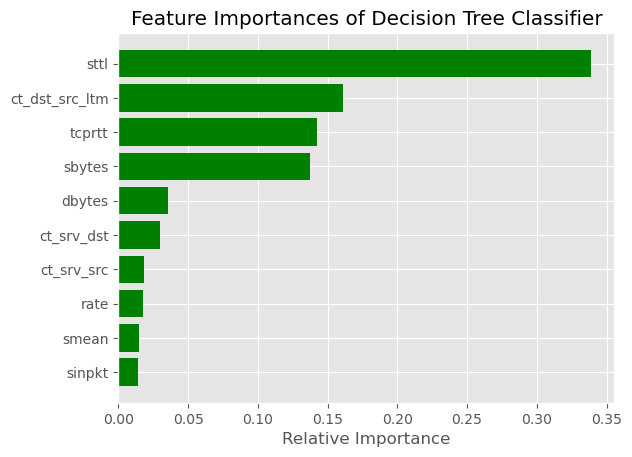

In [70]:
importances = DTclf.feature_importances_
indices = np.argsort(importances)
features = np.array(numerical_cols)
plt.title('Feature Importances of Decision Tree Classifier')
count = 10 # top # importance
plt.barh(range(count), importances[indices][len(indices)-count:], color='g', align='center')
plt.yticks(range(count), [features[i] for i in indices[len(indices)-count:]])
plt.xlabel('Relative Importance')
plt.show()

In [71]:
DTclf.feature_importances_

array([4.20745157e-03, 1.53240167e-03, 9.32188440e-04, 1.37259103e-01,
       3.53332712e-02, 1.73964848e-02, 3.38763413e-01, 0.00000000e+00,
       6.23353397e-03, 6.22280868e-03, 1.91106697e-03, 3.86415361e-04,
       1.41477710e-02, 3.75434638e-03, 3.11998823e-03, 3.02235419e-03,
       2.38653000e-04, 4.17171274e-03, 4.67552525e-03, 0.00000000e+00,
       1.42537731e-01, 6.33434130e-03, 5.20461432e-03, 1.47306128e-02,
       4.44093344e-03, 1.92784370e-03, 3.92933269e-03, 1.80136032e-02,
       3.42446077e-04, 8.36554088e-03, 6.28338648e-03, 6.26728634e-03,
       1.61122769e-01, 2.33872447e-05, 0.00000000e+00, 1.90018792e-03,
       5.48405591e-03, 2.97834384e-02, 0.00000000e+00])

In [72]:
!pip install eli5

In [73]:

DTclf = DecisionTreeClassifier(criterion="entropy", max_depth=5)

# Train Decision Tree Classifer
DTclf = DTclf.fit(X_train_transform, y2_train_transform)

#Predict the response for test dataset
y_pred = DTclf.predict(X_test_transform)

In [74]:
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y2_test_transform, y_pred))

report=metrics.classification_report(y2_test_transform,y_pred)

DTclf_name=['Decision Tree Classifer','RegLog']

print('Reporting for %s:'%DTclf_name)

print(report)

Accuracy: 0.8510901614568184
Reporting for ['Decision Tree Classifer', 'RegLog']:
              precision    recall  f1-score   support

           0       0.69      0.98      0.81     56000
           1       0.99      0.79      0.88    119341

    accuracy                           0.85    175341
   macro avg       0.84      0.88      0.84    175341
weighted avg       0.89      0.85      0.86    175341



In [75]:
import eli5 #for purmutation importance
from eli5.sklearn import PermutationImportance
perm = PermutationImportance(DTclf, random_state=1).fit(X_test_transform, y2_test_transform)
eli5.show_weights(perm, feature_names = np.array(numerical_cols))

Weight,Feature
0.2755 ± 0.0003,sttl
0.2411 ± 0.0007,ct_dst_sport_ltm
0.1359 ± 0.0014,sbytes
0.0707 ± 0.0012,ct_dst_src_ltm
0.0354 ± 0.0002,sloss
0.0288 ± 0.0009,smean
0.0108 ± 0.0005,dbytes
0.0011 ± 0.0001,sinpkt
0.0005 ± 0.0001,ct_dst_ltm
0 ± 0.0000,sjit


In [76]:
import sklearn
import sklearn.datasets
import sklearn.ensemble
import numpy as np
import lime
import lime.lime_tabular
from __future__ import print_function
np.random.seed(1)
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=123)

DTclf = tree.DecisionTreeClassifier()


scoring = ['accuracy', 'precision_micro', 'recall_micro', 'f1_micro', 'roc_auc_ovr']  

# perform the 5-fold CV and get the metrics results
cv_results = cross_validate(estimator=DTclf,
                            X=X_train_transform,
                            y=y2_train_transform,
                            scoring=scoring,
                            cv=cv,
                            return_train_score=False) # prevent to show the train scores on cv splits.

In [77]:
cv_results

{'fit_time': array([0.90100932, 0.9349618 , 0.87232542, 0.97941661, 0.79692435]),
 'score_time': array([0.02599168, 0.02403545, 0.03124714, 0.01562214, 0.03125024]),
 'test_accuracy': array([0.96417077, 0.96666059, 0.96465444, 0.9647759 , 0.96684076]),
 'test_precision_micro': array([0.96417077, 0.96666059, 0.96465444, 0.9647759 , 0.96684076]),
 'test_recall_micro': array([0.96417077, 0.96666059, 0.96465444, 0.9647759 , 0.96684076]),
 'test_f1_micro': array([0.96417077, 0.96666059, 0.96465444, 0.9647759 , 0.96684076]),
 'test_roc_auc_ovr': array([0.96371283, 0.96617905, 0.96400129, 0.96433825, 0.9665723 ])}

In [78]:
cv_results['test_accuracy'].mean()

0.9654204927564717

In [79]:


DTclf.fit(X=X_train_transform, y=y2_train_transform)

# predition on testing data
y_pred_class = DTclf.predict(X=X_test_transform)
y_pred_score = DTclf.predict_proba(X=X_test_transform)[:, 1]

# AUC of ROC
auc_ontest = roc_auc_score(y_true=y2_test_transform, y_score=y_pred_score)
# confusion matrix
cm_ontest = confusion_matrix(y_true=y2_test_transform, y_pred=y_pred_class)
# precision score
precision_ontest = precision_score(y_true=y2_test_transform, y_pred=y_pred_class)
# recall score
recall_ontest = recall_score(y_true=y2_test_transform, y_pred=y_pred_class)
# classifition report
cls_report_ontest = classification_report(y_true=y2_test_transform, y_pred=y_pred_class)

# print the above results
print('The model scores {:1.5f} ROC AUC on the test set.'.format(auc_ontest))
print('The precision score on the test set: {:1.5f}'.format(precision_ontest))
print('The recall score on the test set: {:1.5f}'.format(recall_ontest))
print('Confusion Matrix:\n', cm_ontest)
# Print classification report:
print('Classification Report:\n', cls_report_ontest)

The model scores 0.90991 ROC AUC on the test set.
The precision score on the test set: 0.97951
The recall score on the test set: 0.85800
Confusion Matrix:
 [[ 53858   2142]
 [ 16947 102394]]
Classification Report:
               precision    recall  f1-score   support

           0       0.76      0.96      0.85     56000
           1       0.98      0.86      0.91    119341

    accuracy                           0.89    175341
   macro avg       0.87      0.91      0.88    175341
weighted avg       0.91      0.89      0.89    175341



###### Exapand DT Classfier to RT Classfier to show XAI also

## Explainable AI (XAI) with a MLP (Multi-Layer Perceptron)

Lime: Explaining the predictions of any machine learning classifier

In [80]:
import sklearn
import sklearn.datasets
import sklearn.ensemble
import numpy as np
import lime
import lime.lime_tabular
from __future__ import print_function
np.random.seed(1)

In [258]:
MLP = MLPClassifier(random_state=123, solver='adam', max_iter=8000)
MLP.fit(X_train_transform, y2_train_transform)

MLPClassifier(max_iter=8000, random_state=123)

#### Explaining predictions

In [259]:
metrics.accuracy_score(y2_test_transform, gbtree.predict(X_test_transform))

Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption


0.8982953216874547

In [260]:
predict_fn = lambda x: gbtree.predict_proba(x).astype(float)

In [261]:
features = np.array(numerical_cols)
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_transform ,feature_names = features, class_names = ['Normal', 'Attack'], kernel_width=3)

In [265]:
np.random.seed(1)
i = 1653
exp = explainer.explain_instance(X_test_transform[i], predict_fn, num_features=10)
exp.show_in_notebook(show_all=False)
print('True class: ')
if (y2_test_transform[i] == 0):
    print('Normal')
else:
    print('Attack')

True class: 
Normal


In [81]:
!pip install xgboost

In [82]:
!pip install shap

In [83]:
from sklearn.model_selection import train_test_split
import xgboost
import shap
import numpy as np
import matplotlib.pylab as pl

##### Load Dataset

In [111]:
!pip install --upgrade xgboost
#xg_train = xgboost.DMatrix(X_train_transform, label=y2_train_transform,enable_categorical=True)
#xg_test = xgboost.DMatrix(X_test_transform, label=y2_test_transform,enable_categorical=True)
xg_train = xgboost.DMatrix(X_train_transform,label=y2_train_transform,enable_categorical=True)
xg_test = xgboost.DMatrix(X_test_transform, label=y2_test_transform,enable_categorical=True)

In [112]:
params = {
    "eta": 0.01,
    "objective": "binary:logistic",
    "subsample": 0.5,
    "base_score": np.mean(y2_train_transform),
    "eval_metric": "logloss",
    'enable_categorical':True
}
model = xgboost.train(params, xg_train, 5000, evals = [(xg_test, "test")], verbose_eval=100, early_stopping_rounds=20)

[0]	test-logloss:0.65451


C:\Users\MrLaptop\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [18:03:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "enable_categorical" } are not used.

  warnings.warn(smsg, UserWarning)


[100]	test-logloss:0.33033
[200]	test-logloss:0.25550
[300]	test-logloss:0.23122
[400]	test-logloss:0.22510
[433]	test-logloss:0.22485


In [114]:
# this takes a minute or two since we are explaining over 30 thousand samples in a model with over a thousand trees
explainer = shap.TreeExplainer(model)
shap_values_test = explainer.shap_values(X)

##### Visualize a single prediction

In [116]:
# print the JS visualization code to the notebook
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values_test[5,:], X.iloc[5,:])

In [117]:
y2_test[5]

0

###### Visualize many predictions

In [118]:
shap.force_plot(explainer.expected_value, shap_values_test[:1000,:], X.iloc[:1000,:])

###### Bar chart of mean importance

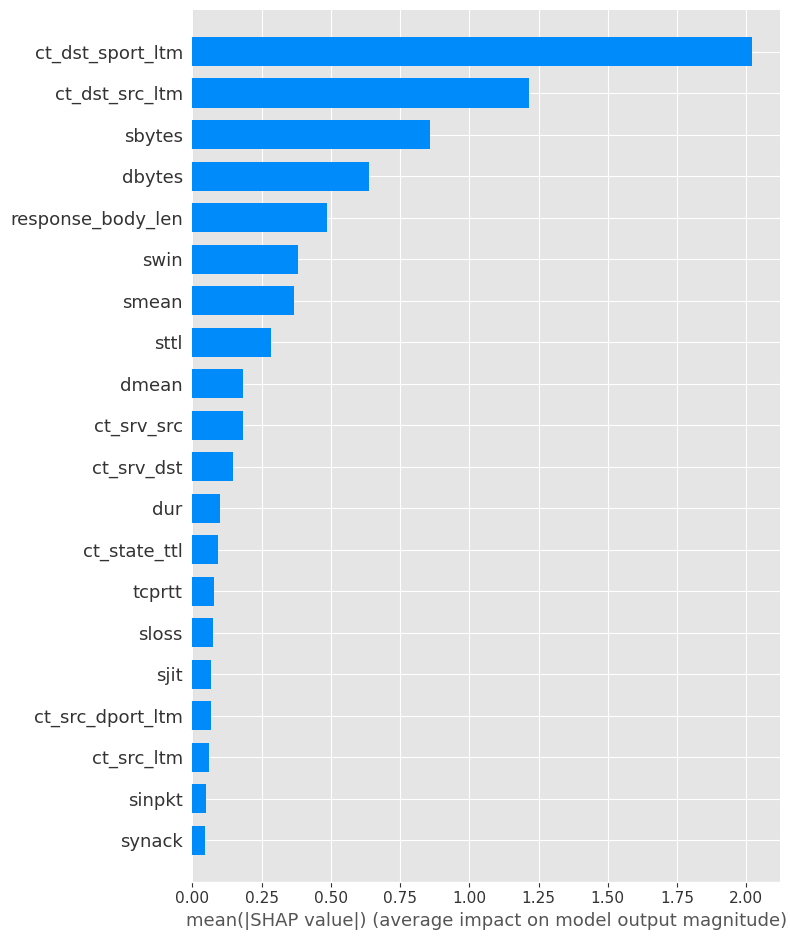

In [119]:
shap.summary_plot(shap_values_test, X, plot_type="bar")

SHAP Summary Plot:
Rather than use a typical feature importance bar chart, we use a density scatter plot of SHAP values for each feature to identify how much impact each feature has on the model output for individuals in the validation dataset. Features are sorted by the sum of the SHAP value magnitudes across all samples. It is interesting to note that the relationship feature has more total model impact than the captial gain feature, but for those samples where capital gain matters it has more impact than age. In other words, capital gain effects a few predictions by a large amount, while age effects all predictions by a smaller amount.

Note that when the scatter points don't fit on a line they pile up to show density, and the color of each point represents the feature value of that individual.

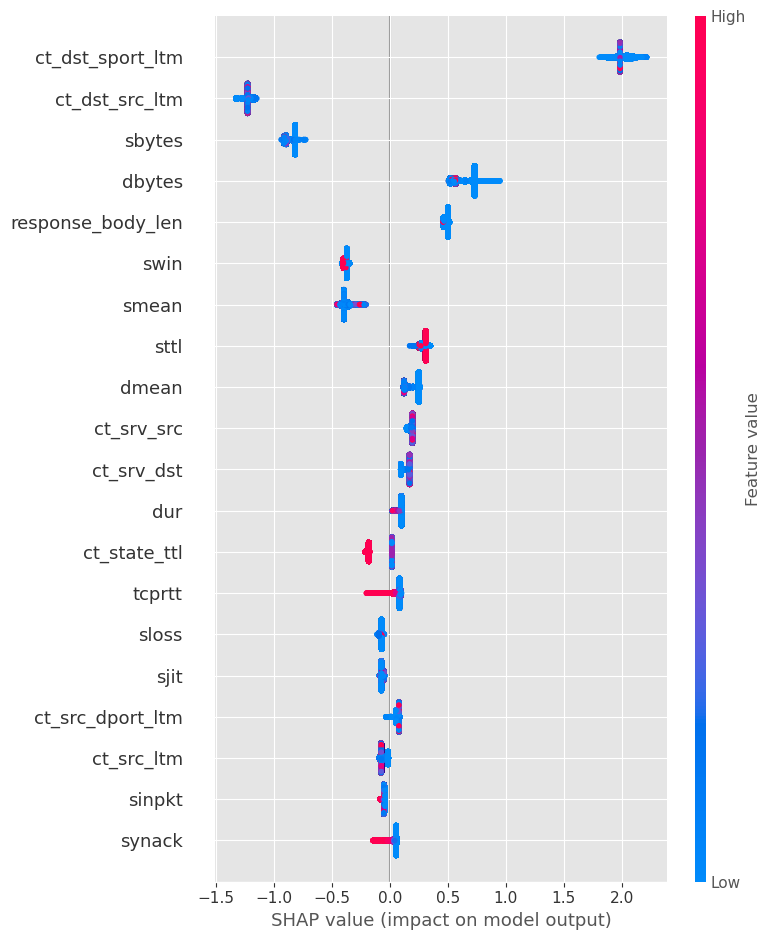

In [120]:
shap.summary_plot(shap_values_test, X)

###### SHAP Dependence Plots
SHAP dependence plots show the effect of a single feature across the whole dataset. They plot a feature's value vs. the SHAP value of that feature across many samples. SHAP dependence plots are similar to partial dependence plots, but account for the interaction effects present in the features, and are only defined in regions of the input space supported by data. The vertical dispersion of SHAP values at a single feature value is driven by interaction effects, and another feature is chosen for coloring to highlight possible interactions.

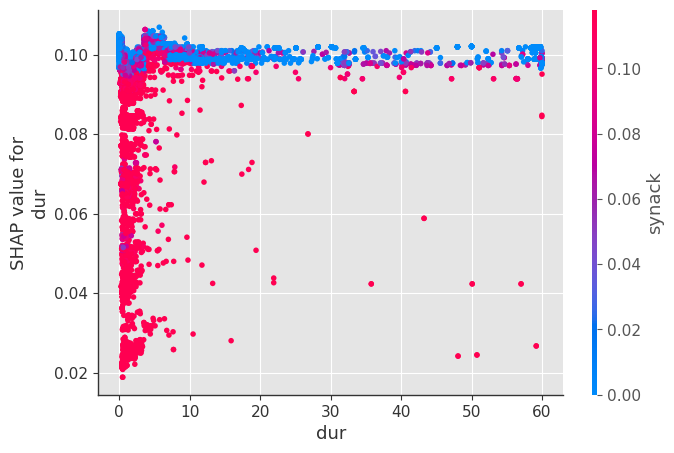

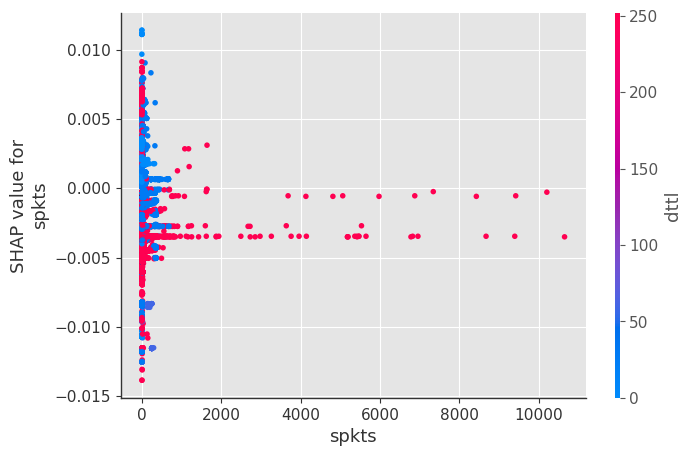

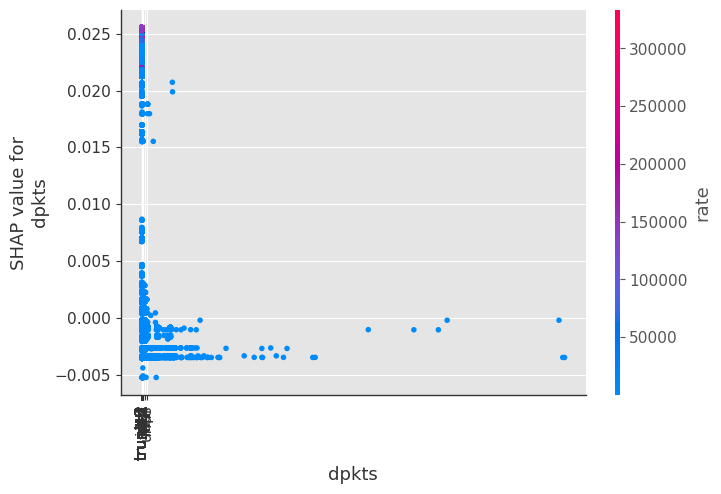

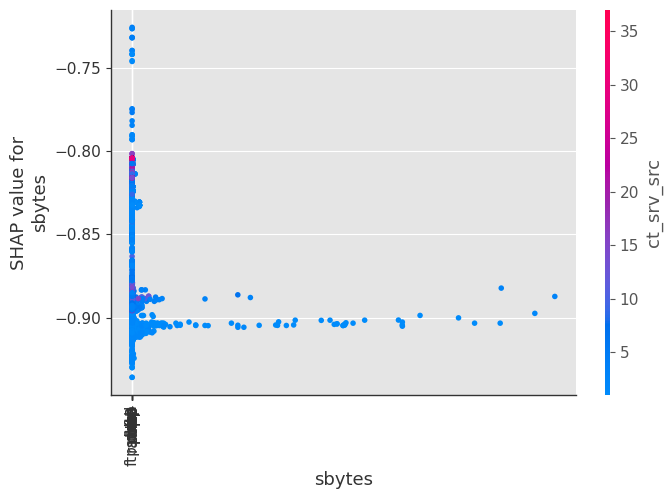

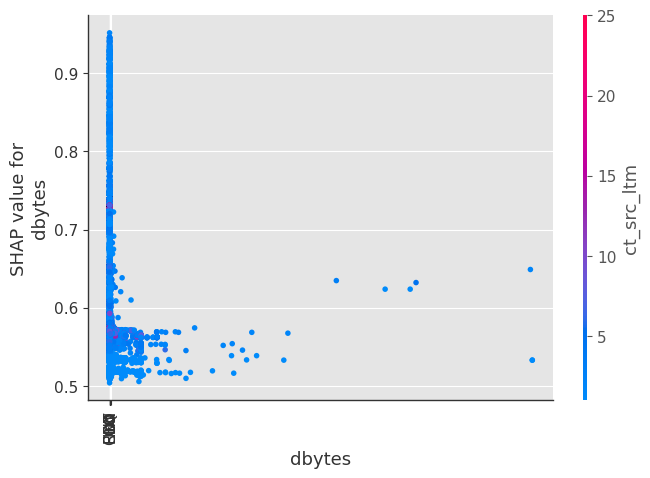

...

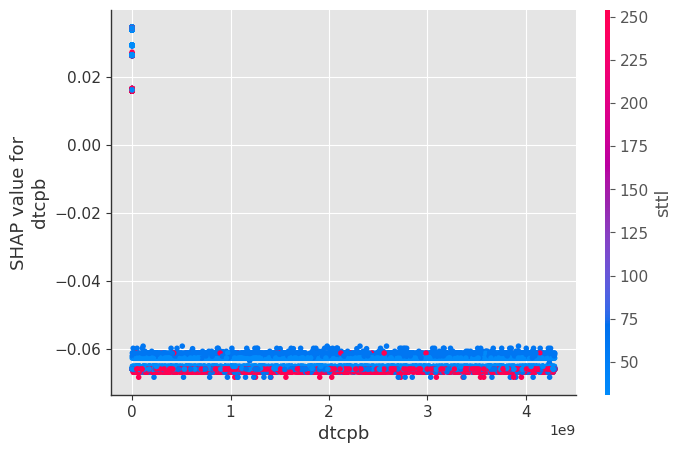

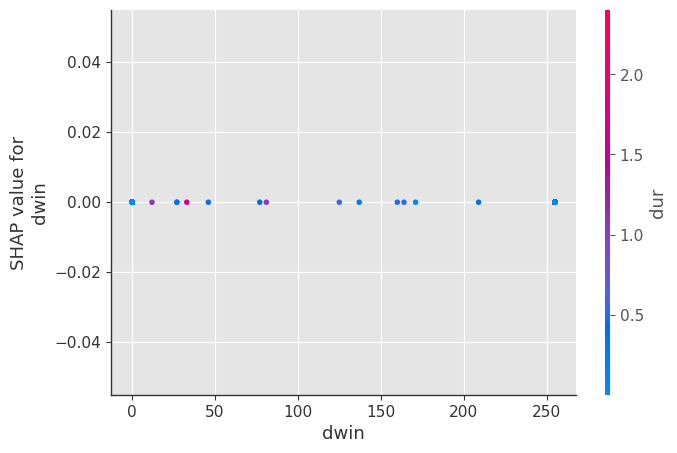

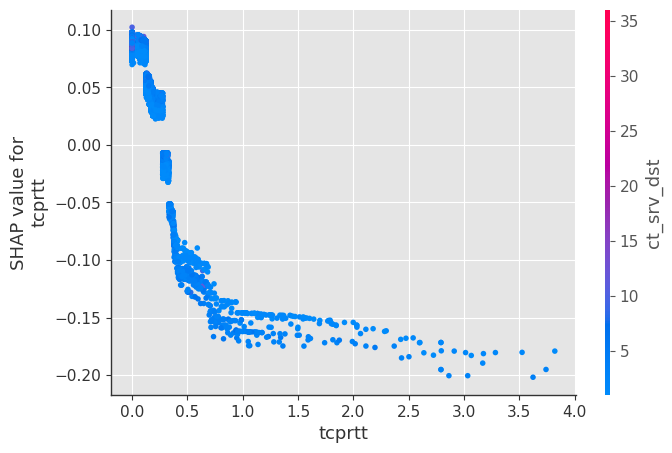

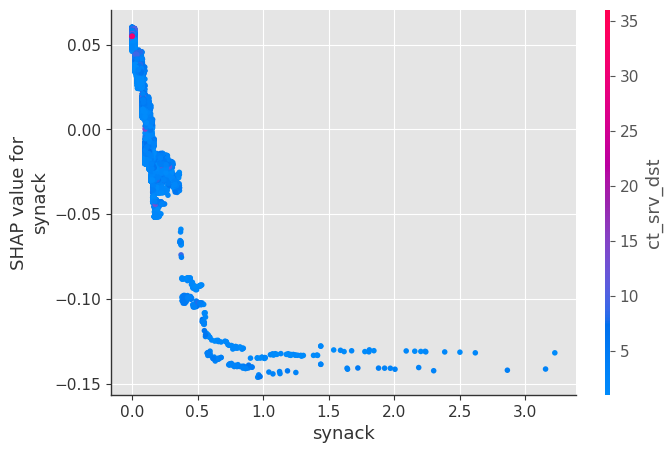

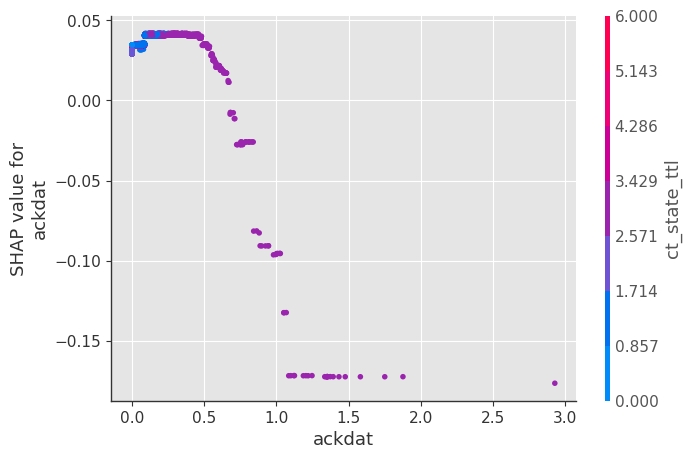

C:\Users\MrLaptop\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\MrLaptop\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


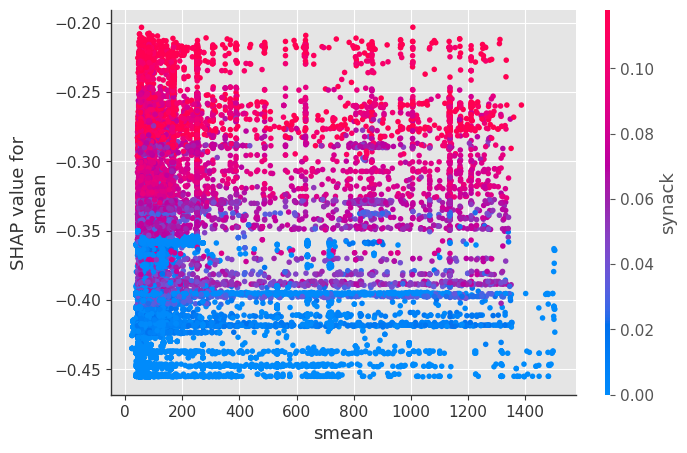

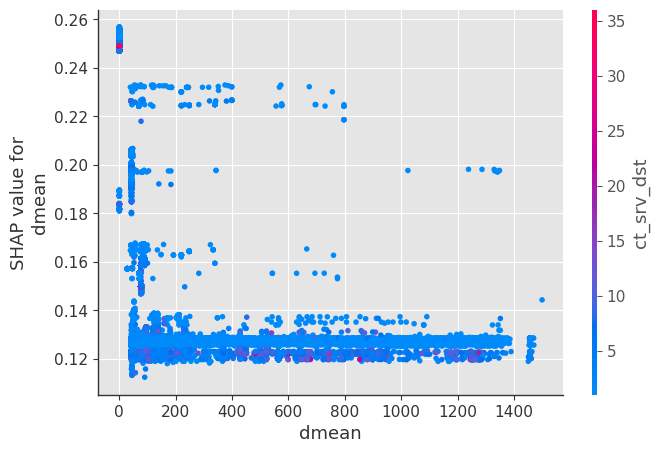

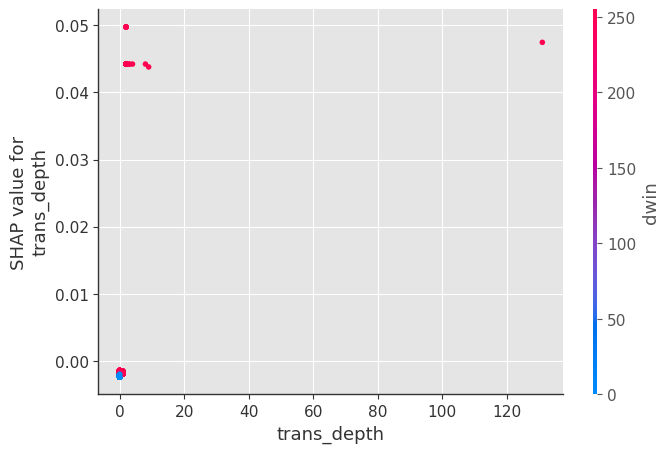

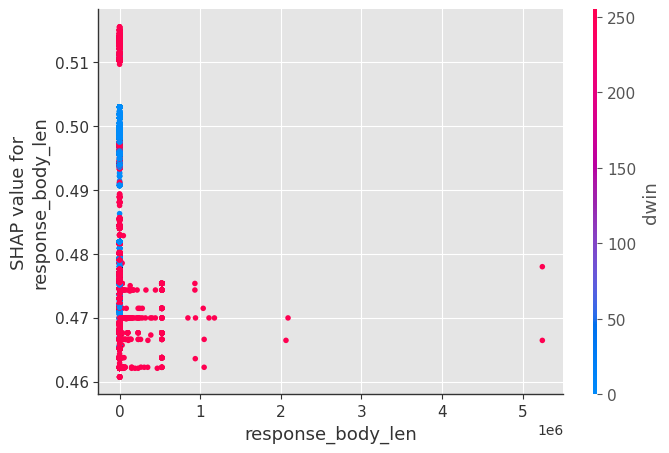

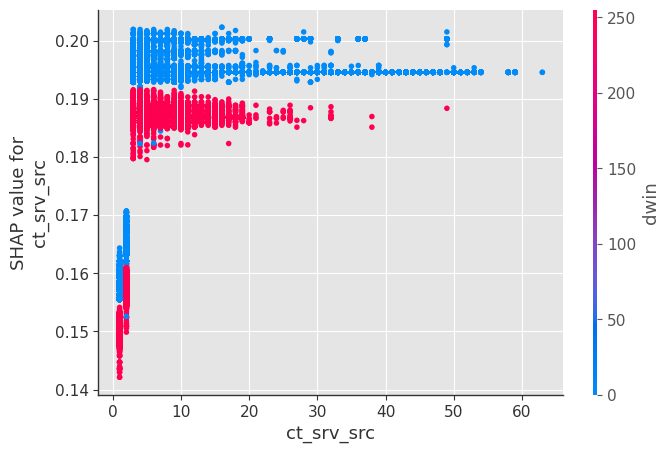

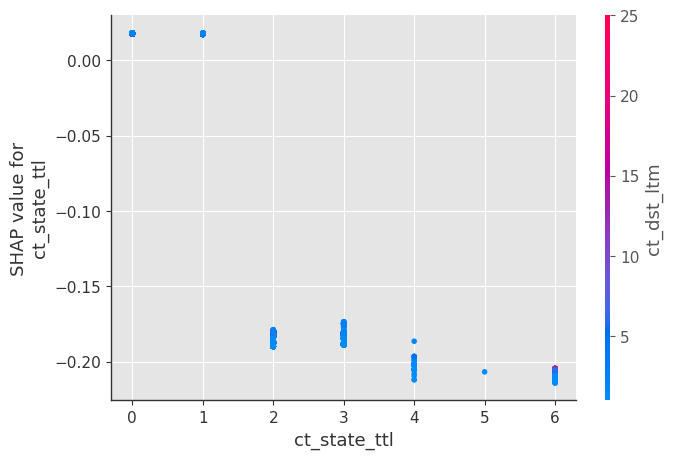

C:\Users\MrLaptop\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\MrLaptop\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


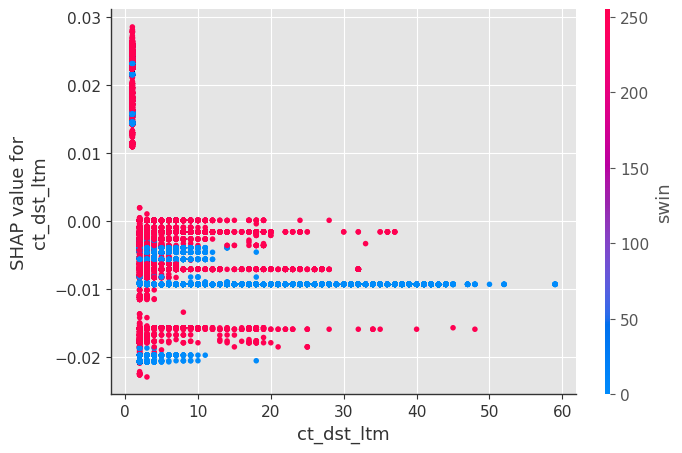

C:\Users\MrLaptop\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\MrLaptop\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


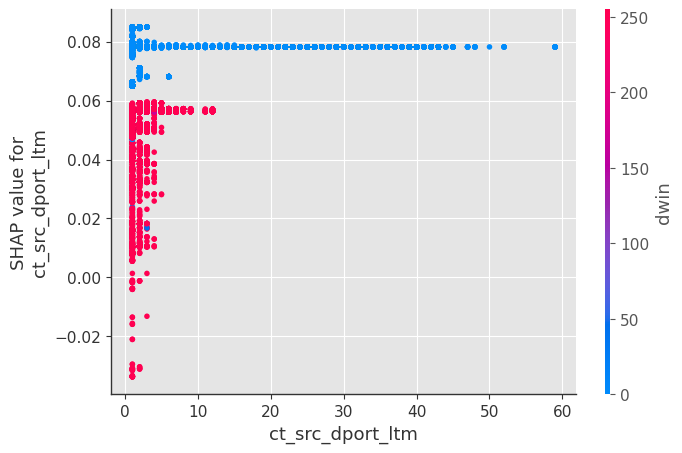

C:\Users\MrLaptop\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\MrLaptop\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


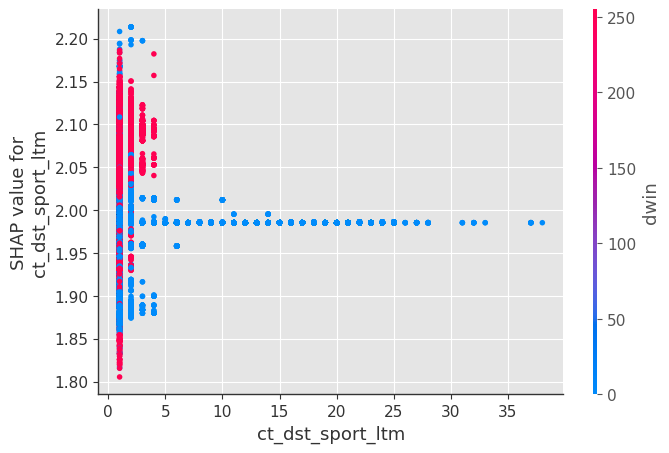

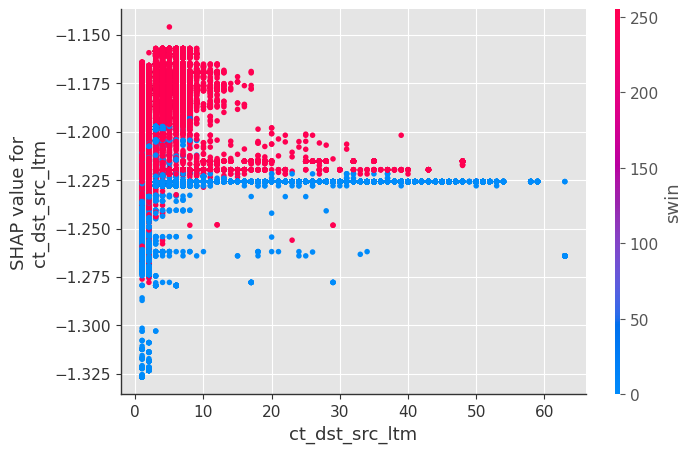

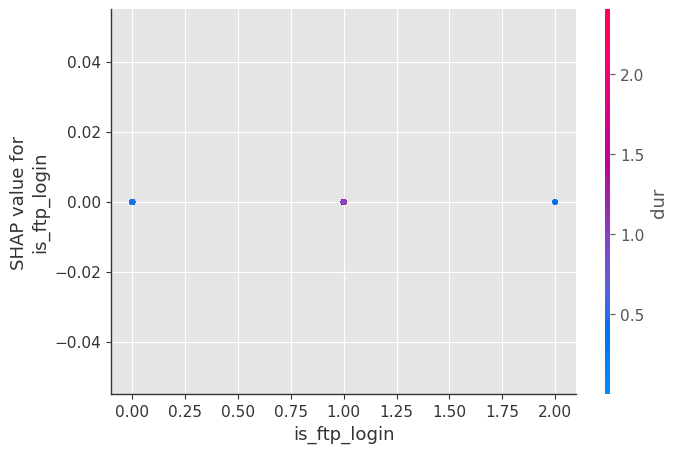

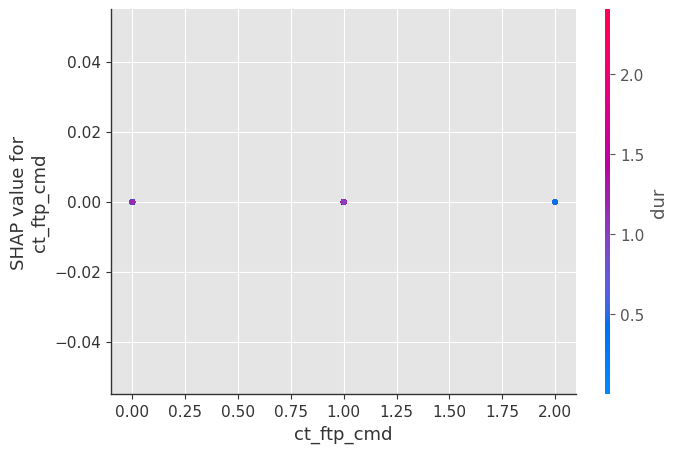

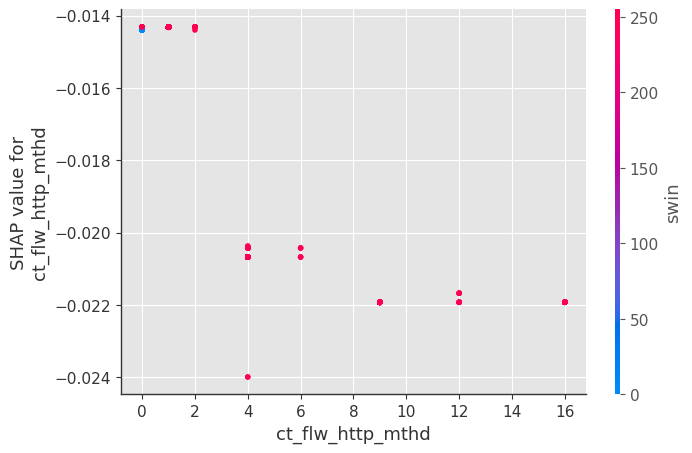

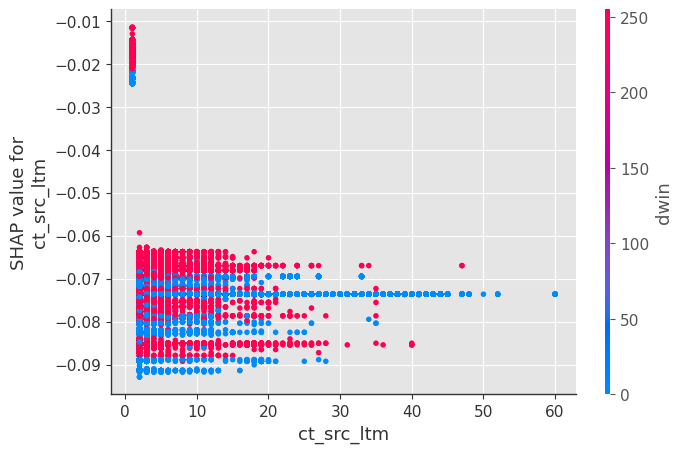

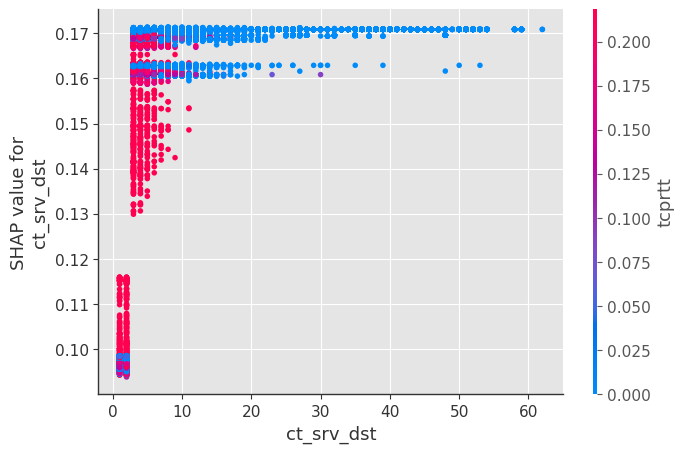

C:\Users\MrLaptop\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\MrLaptop\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


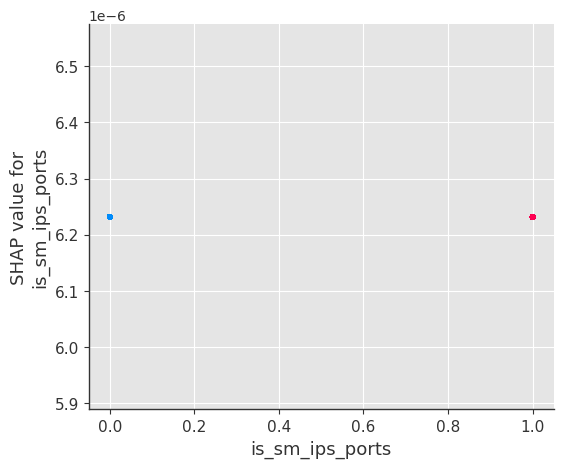

In [121]:
for name in X.columns:
    shap.dependence_plot(name, shap_values_test, X, display_features=X_test)

###### Compute SHAP Interaction Values

See the Tree SHAP paper for more details, but briefly, SHAP interaction values are a generalization of SHAP values to higher order interactions. Fast exact computation of pairwise interactions are implemented in the latest version of XGBoost with the pred_interactions flag. With this flag XGBoost returns a matrix for every prediction, where the main effects are on the diagonal and the interaction effects are off-diagonal. The main effects are similar to the SHAP values you would get for a linear model, and the interaction effects captures all the higher-order interactions are divide them up among the pairwise interaction terms. Note that the sum of the entire interaction matrix is the difference between the model's current output and expected output, and so the interaction effects on the off-diagonal are split in half (since there are two of each). When plotting interaction effects the SHAP package automatically multiplies the off-diagonal values by two to get the full interaction effect.

In [227]:
# takes a couple minutes since SHAP interaction values take a factor of 2 * # features
# more time than SHAP values to compute, since this is just an example we only explain
# the first 2,000 people in order to run quicker
shap_interaction_values = shap.TreeExplainer(model).shap_interaction_values(X_test.iloc[:2000,:])

###### SHAP Interaction Value Summary Plot
A summary plot of a SHAP interaction value matrix plots a matrix of summary plots with the main effects on the diagonal and the interaction effects off the diagonal.

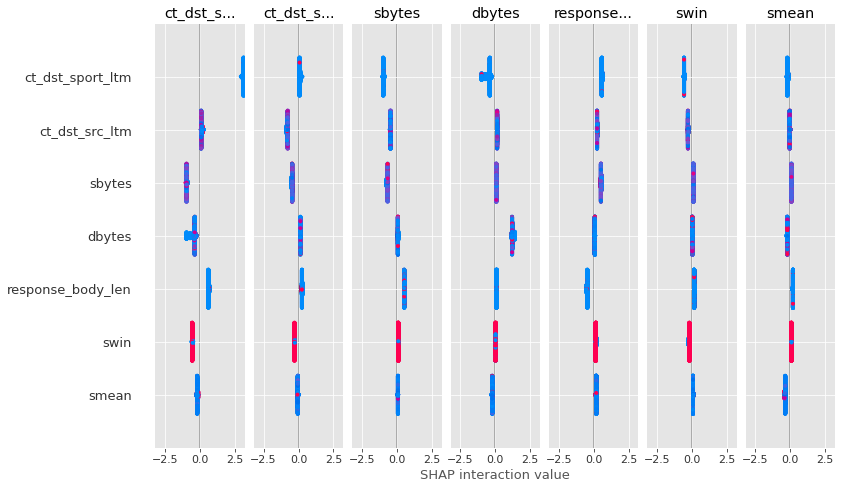

In [228]:
shap.summary_plot(shap_interaction_values, X_test.iloc[:2000,:])

# USING LIME PACKAGE

In [235]:
!pip install lime

  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283850 sha256=8017c7332ac0b7bbc298808960393db143bad64732616602de9dd2e816d8be3b
  Stored in directory: c:\users\harsh\appdata\local\pip\cache\wheels\e6\a6\20\cc1e293fcdb67ede666fed293cb895395e7ecceb4467779546
Successfully built lime


In [236]:
import sklearn
import sklearn.datasets
import sklearn.ensemble
import numpy as np
import lime
import lime.lime_tabular
from __future__ import print_function
np.random.seed(1)

In [245]:
import xgboost
gbtree = xgboost.XGBClassifier(n_estimators=300, max_depth=5)
gbtree.fit(X_train_transform, y2_train_transform)

[00:20:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=300, n_jobs=16, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [246]:
metrics.accuracy_score(y2_test_transform, gbtree.predict(X_test_transform))

0.8982953216874547

In [251]:
predict_fn = lambda x: gbtree.predict_proba(x).astype(float)

#### Explaining predictions

In [249]:
features = np.array(numerical_cols)
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_transform ,feature_names = features, class_names = ['Normal', 'Attack'], kernel_width=3)

These are just a mix of the continuous and categorical examples we showed before. For categorical features, the feature contribution is always the same as the linear model weight.

In [252]:
np.random.seed(1)
i = 1653
exp = explainer.explain_instance(X_test_transform[i], predict_fn, num_features=5)
exp.show_in_notebook(show_all=False)

In [254]:
i = 10
exp = explainer.explain_instance(X_test_transform[i], predict_fn, num_features=5)
exp.show_in_notebook(show_all=False)